<a href="https://colab.research.google.com/github/Omorusi/Neural-network/blob/main/Copy_of_Cat_Dog_classifier_CNN_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Import libraries

In [1]:
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import os
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import glob
import torchvision
from torchvision.datasets import ImageFolder
from torchvision import transforms

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("samuelcortinhas/apples-or-tomatoes-image-classification")

print("Path to dataset files:", path)

100%|██████████| 2.33M/2.33M [00:01<00:00, 2.08MB/s]

Extracting files...
Path to dataset files: /root/.cache/kagglehub/datasets/samuelcortinhas/apples-or-tomatoes-image-classification/versions/1


In [3]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import glob
 #folder/train/tomatoes/
  #folder/train/apples/
# Assuming 'path' is the folder where the dataset is downloaded
train_folder_apples = os.path.join(path, 'train/apples')  # Folder containing training images
test_folder_apples = os.path.join(path, 'test/apples')    # Folder containing testing images

train_folder_tomatoes = os.path.join(path, 'train/tomatoes')  # Folder containing training images
test_folder_tomatoes = os.path.join(path, 'test/tomatoes')    # Folder containing testing images

# Get the list of image files in the 'train' folder
train_image_files_apples = glob.glob(os.path.join(train_folder_apples, '**/*.jpeg'), recursive=True)

# Get the list of image files in the 'test' folder
test_image_files_apples = glob.glob(os.path.join(test_folder_apples, '**/*.jpeg'), recursive=True)

# Get the list of image files in the 'train' folder
train_image_files_tomatoes = glob.glob(os.path.join(train_folder_apples, '**/*.jpeg'), recursive=True)

# Get the list of image files in the 'test' folder
test_image_files_tomatoes = glob.glob(os.path.join(test_folder_tomatoes, '**/*.jpeg'), recursive=True)

Number of train images: 164
Number of test images: 54
Displaying train images:


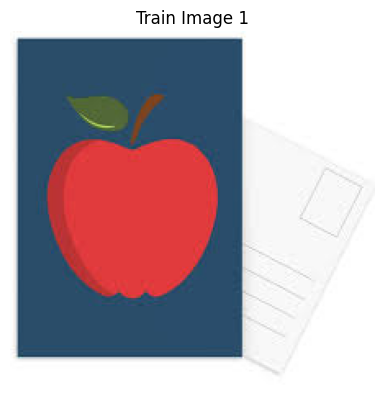

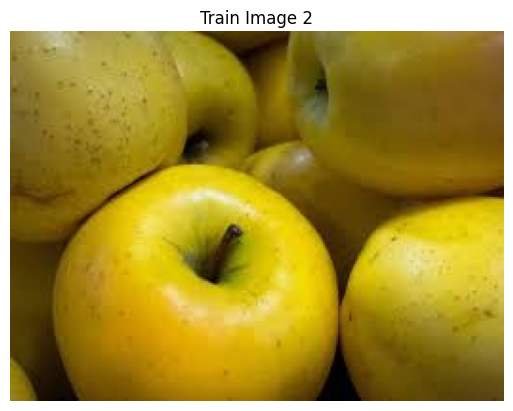

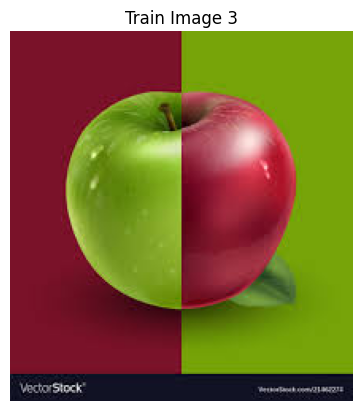

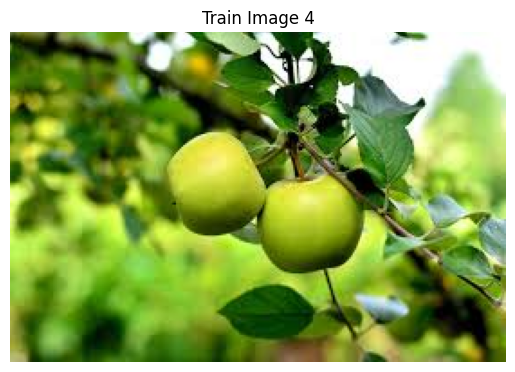

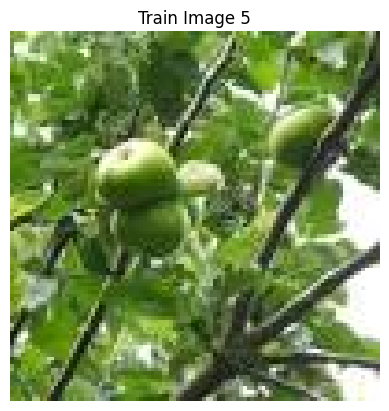

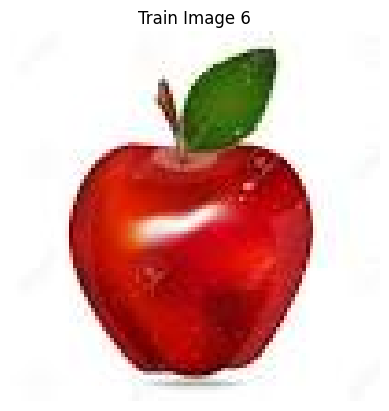

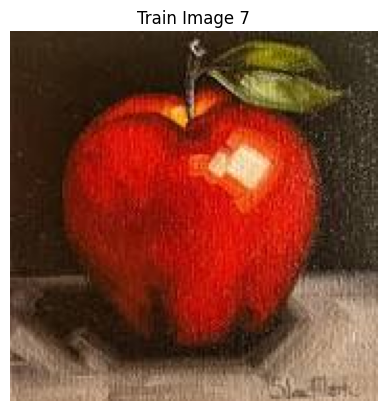

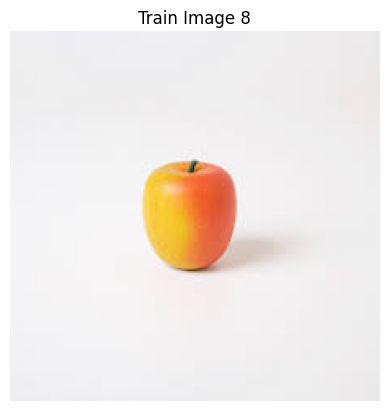

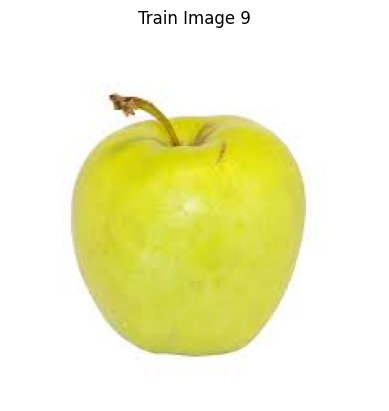

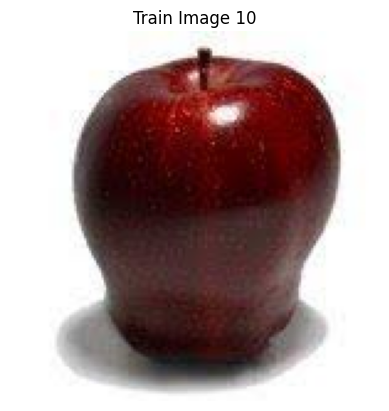

Displaying test images:


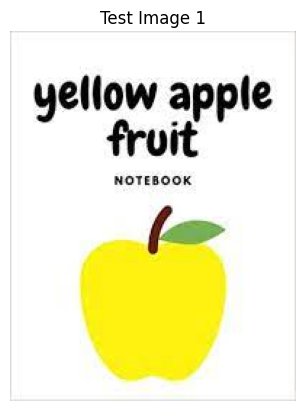

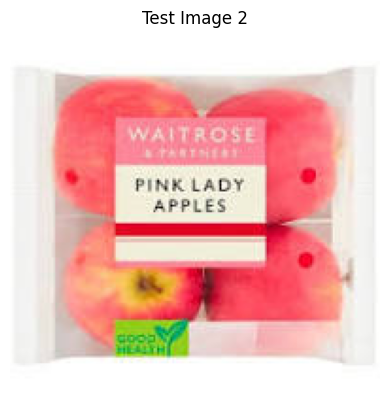

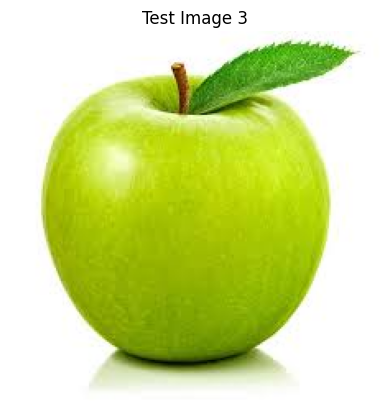

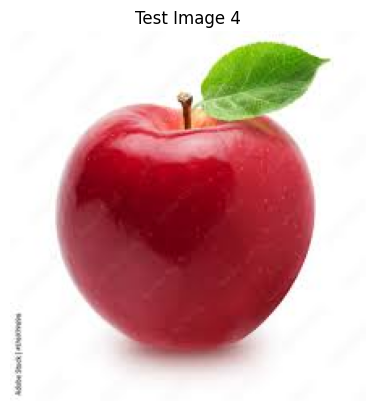

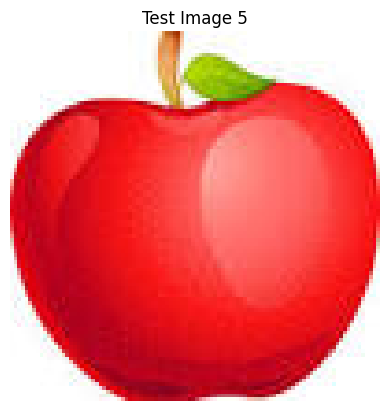

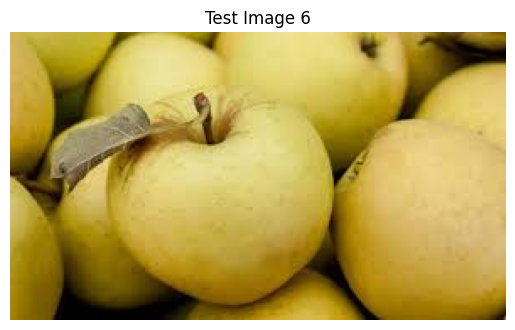

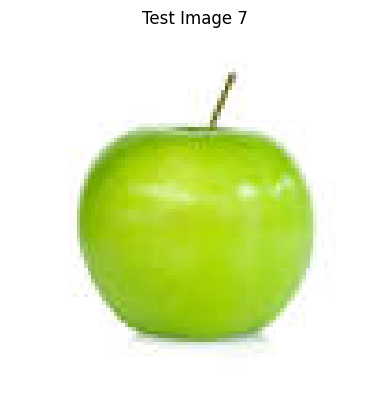

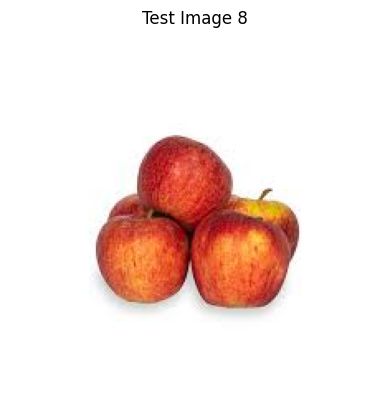

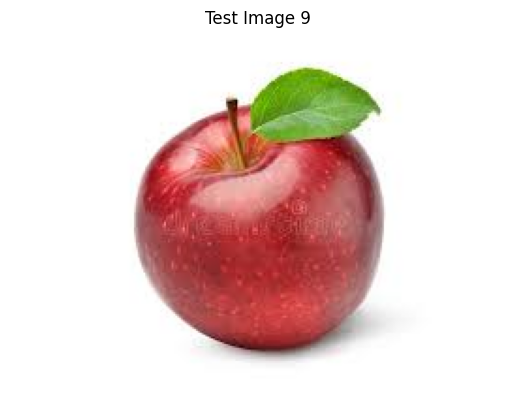

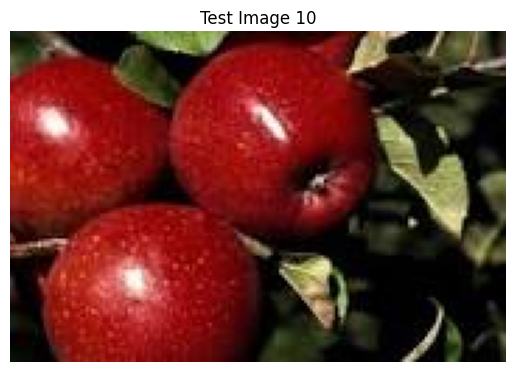

In [4]:


# Check how many images are available
print(f"Number of train images: {len(train_image_files_apples)}")
print(f"Number of test images: {len(test_image_files_apples)}")

# Display the first few images from the 'train' folder
print("Displaying train images:")
num_train_images_to_display = min(10, len(train_image_files_apples))  # Show up to 10 or the available images
for i in range(num_train_images_to_display):
    img = Image.open(train_image_files_apples[i])
    plt.figure()
    plt.imshow(img)
    plt.title(f"Train Image {i+1}")
    plt.axis('off')
    plt.show()

# Display the first few images from the 'test' folder
print("Displaying test images:")
num_test_images_to_display = min(10, len(test_image_files_apples))  # Show up to 10 or the available images
for i in range(num_test_images_to_display):
    img = Image.open(test_image_files_apples[i])
    plt.figure()
    plt.imshow(img)
    plt.title(f"Test Image {i+1}")
    plt.axis('off')
    plt.show()


Number of train images: 164
Number of test images: 43
Displaying train images:


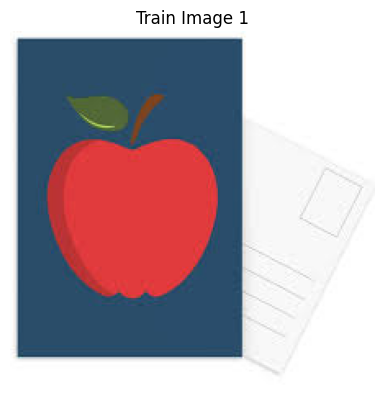

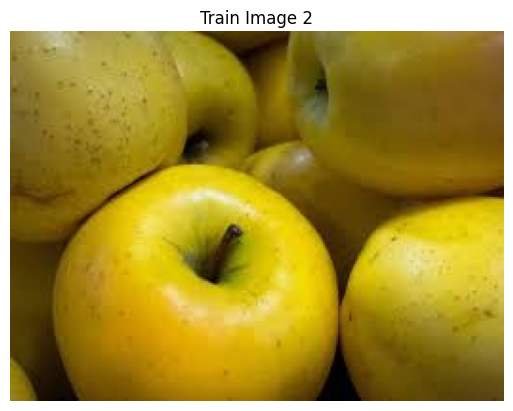

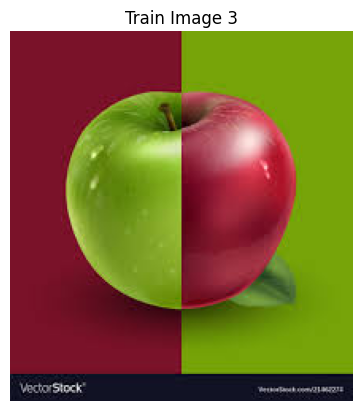

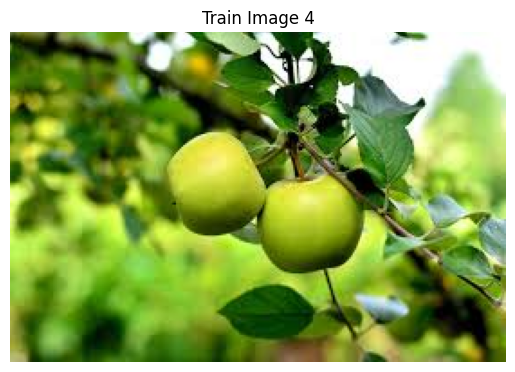

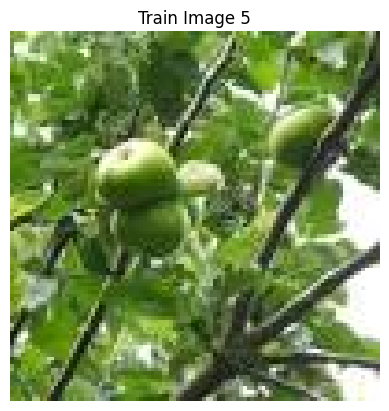

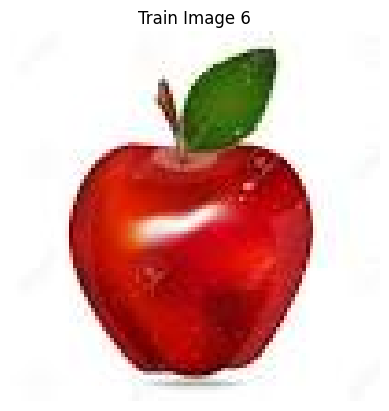

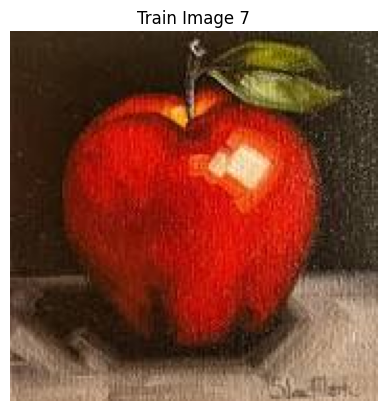

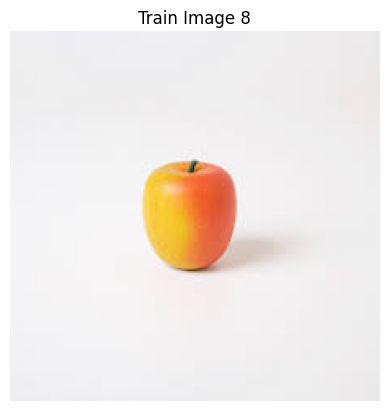

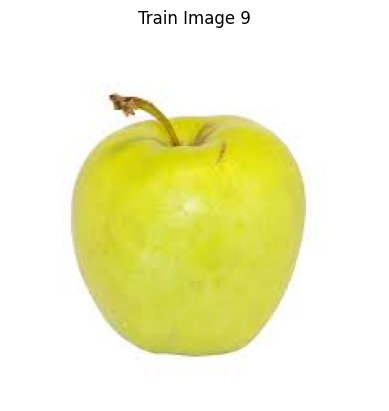

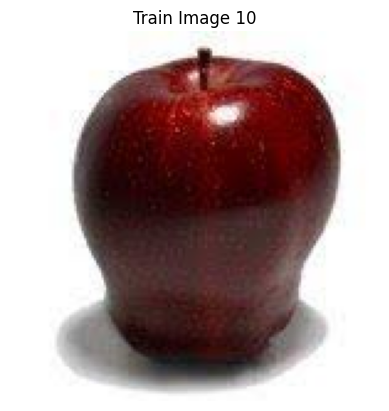

Displaying test images:


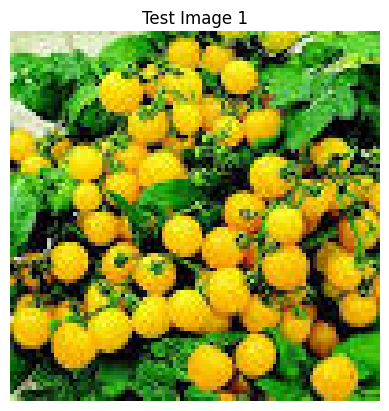

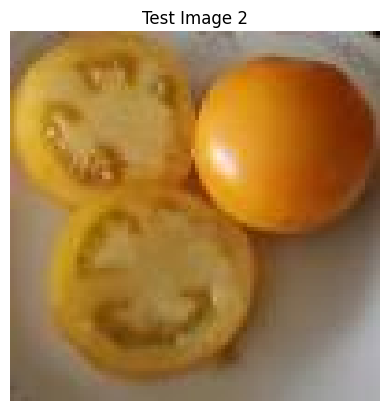

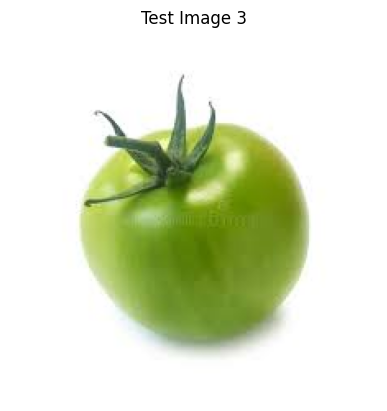

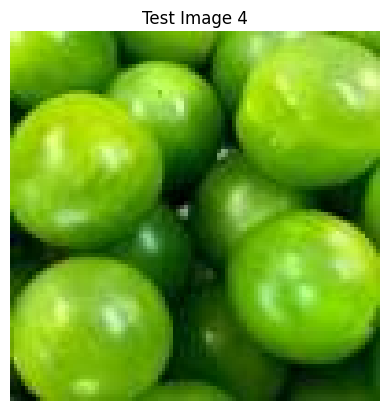

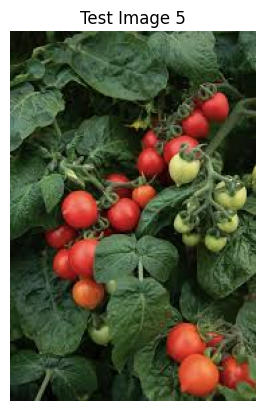

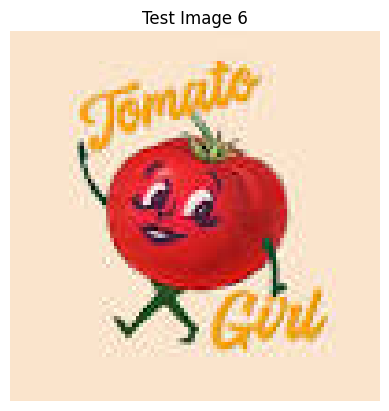

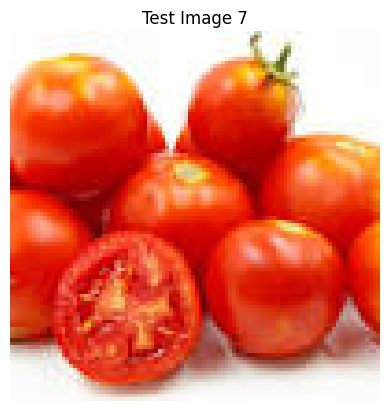

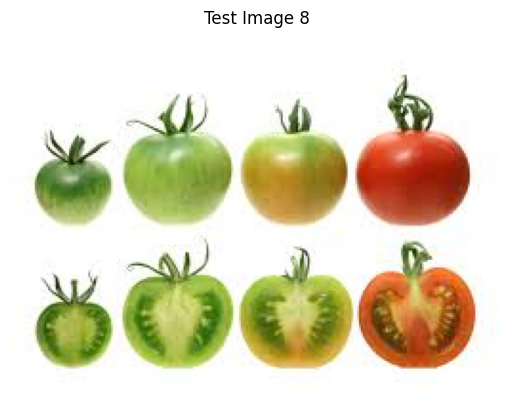

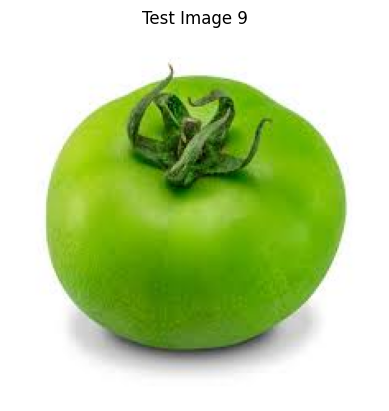

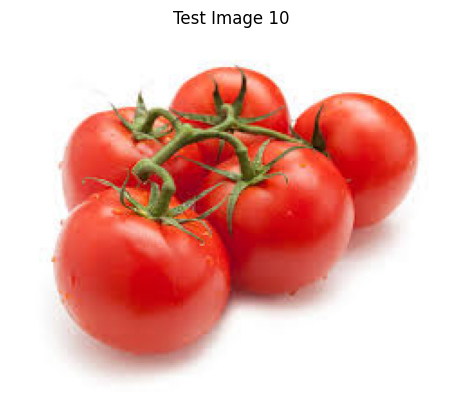

In [30]:
# Repeat process with the tomatoes


# Check how many images are available
print(f"Number of train images: {len(train_image_files_tomatoes)}")
print(f"Number of test images: {len(test_image_files_tomatoes)}")

# Display the first few images from the 'train' folder
print("Displaying train images:")
num_train_images_to_display = min(10, len(train_image_files_tomatoes))  # Show up to 10 or the available images
for i in range(num_train_images_to_display):
    img = Image.open(train_image_files_tomatoes[i])
    plt.figure()
    plt.imshow(img)
    plt.title(f"Train Image {i+1}")
    plt.axis('off')
    plt.show()

# Display the first few images from the 'test' folder
print("Displaying test images:")
num_test_images_to_display = min(10, len(test_image_files_tomatoes))  # Show up to 10 or the available images
for i in range(num_test_images_to_display):
    img = Image.open(test_image_files_tomatoes[i])
    plt.figure()
    plt.imshow(img)
    plt.title(f"Test Image {i+1}")
    plt.axis('off')
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the counts for cats and dogs in validation and train sets
tomatoes_test_count = len(cats_val)
apples_validation_count = len(dog_val)
_train_count = len(cats_train)
dogs_train_count = len(dog_train)

# Create the labels for the x-axis
labels = ['Cats', 'Dogs']

# Create the counts for validation and train sets
validation_counts = [cats_validation_count, dogs_validation_count]
train_counts = [cats_train_count, dogs_train_count]

# Set the positions and width of the bars
positions = np.arange(len(labels))
bar_width = 0.35

# Plot the bars
plt.bar(positions - bar_width/2, train_counts, bar_width, label='Train')
plt.bar(positions + bar_width/2, validation_counts, bar_width, label='TEST')

# Set the labels and title
plt.xlabel('Animal')
plt.ylabel('Number of Images')
plt.title('Number of Images of Cats and Dogs')

# Set the x-axis tick labels
plt.xticks(positions, labels)

# Add a legend
plt.legend()

# Show the plot
plt.show()

#Data Preparation

##EDA

In [ ]:
image_sizes = []
for img_file in image_files[:100]:  # Check first 100 images
    img = cv2.imread(os.path.join(image_dir, img_file))
    image_sizes.append(img.shape[:2])  # (height, width)

# Convert to Pandas DataFrame
import pandas as pd
df_sizes = pd.DataFrame(image_sizes, columns=["Height", "Width"])
print(df_sizes.describe())


       Height  Width
count   100.0  100.0
mean    256.0  256.0
std       0.0    0.0
min     256.0  256.0
25%     256.0  256.0
50%     256.0  256.0
75%     256.0  256.0
max     256.0  256.0


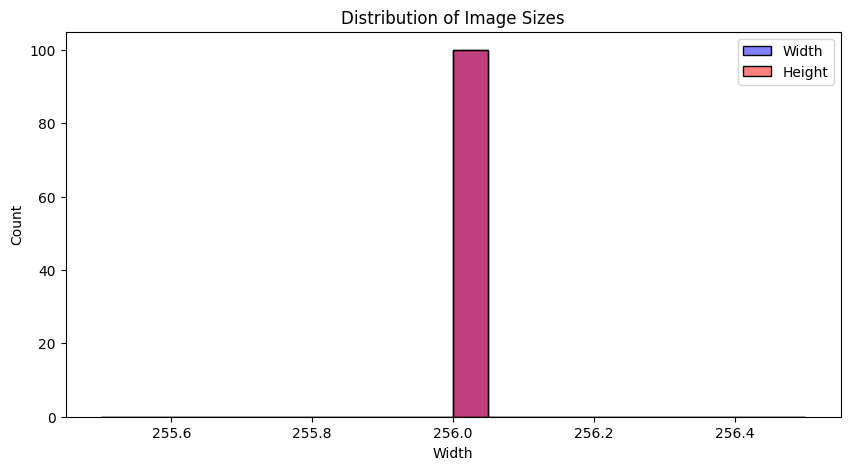

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.histplot(df_sizes["Width"], bins=20, kde=True, label="Width", color="blue")
sns.histplot(df_sizes["Height"], bins=20, kde=True, label="Height", color="red")
plt.legend()
plt.title("Distribution of Image Sizes")
plt.show()


In [ ]:
import numpy as np

# Function to compute average RGB values
def get_avg_color(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return np.mean(img, axis=(0,1))  # Average per channel

# Compute for a sample of 100 images
colors = np.array([get_avg_color(os.path.join(image_dir, img)) for img in random.sample(image_files, 100)])

# Plot color distribution
plt.figure(figsize=(8, 5))
plt.hist(colors[:, 0], bins=20, alpha=0.5, color="red", label="Red")
plt.hist(colors[:, 1], bins=20, alpha=0.5, color="green", label="Green")
plt.hist(colors[:, 2], bins=20, alpha=0.5, color="blue", label="Blue")
plt.legend()
plt.title("Average Color Distribution in Images")
plt.show()


NameError: name 'random' is not defined

#TEST

In [ ]:
from sklearn.metrics import f1_score, confusion_matrix, classification_report

In [ ]:
checkpoint = torch.load('/content/checkpoint_epoch_16.pt')  # Load the saved checkpoint file

model = SimpleCNN()  # Create an instance of the model
model.load_state_dict(checkpoint['model_state_dict'])  # Load the model's state dictionary

optimizer = optim.SGD(model.parameters(), lr=0.001)  # Create an instance of the optimizer
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])  # Load the optimizer's state dictionary

In [ ]:
def test(test_loader, model):
    model.to(device)
    model.eval()
    test_loss = 0
    correct = 0

    true_output = []
    pred_output = []
    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            y = y.to(device)
            true_output.append(y.item())

            output = model(x)
            _, predictions = torch.max(output, 1)
            pred_output.append(predictions.item())

            correct += (predictions == y).sum().item()
            test_loss += criterion(output, y)

            # Display the image, predicted label, and actual label
            for i in range(len(x)):
                if i%2 == 0:
                    image = x[i].cpu().numpy()
                    predicted_label = predictions[i].item()
                    actual_label = y[i].item()

                    plt.imshow(np.transpose(image, (1, 2, 0)))
                    plt.title(f"Predicted: {predicted_label}, Actual: {actual_label}")

                    plt.show()

    test_loss /= len(test_loader.dataset)

    print("Average Loss: ", test_loss, "  Accuracy: ", correct, " / ",
    len(test_loader.dataset), "  ", int(correct / len(test_loader.dataset) * 100), "%")

    Confusion_matrix = confusion_matrix(true_output, pred_output)
    report = classification_report(true_output, pred_output)
    F1_score = f1_score(true_output, pred_output, average='macro')

    print('F1 Score is: {}'.format(F1_score))
    print('Classification_Report Score is: {}'.format(report))


    fig = plt.figure(figsize=(15,5))
    sns.heatmap(Confusion_matrix, annot=True, cmap='Blues')
    plt.show()


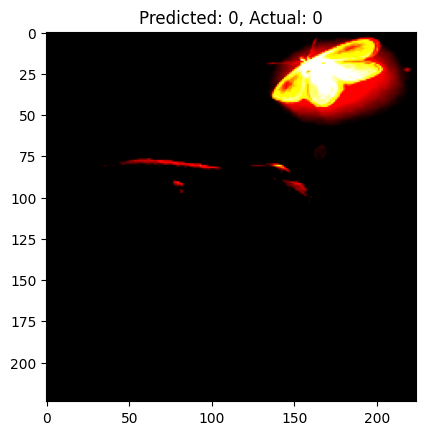

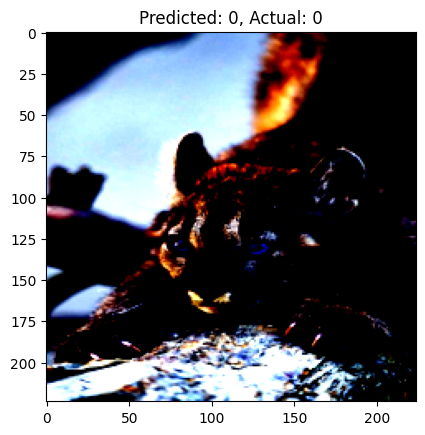

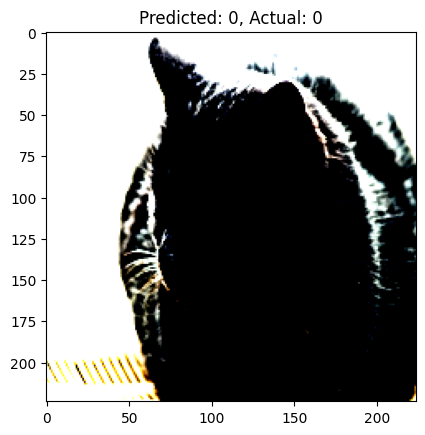

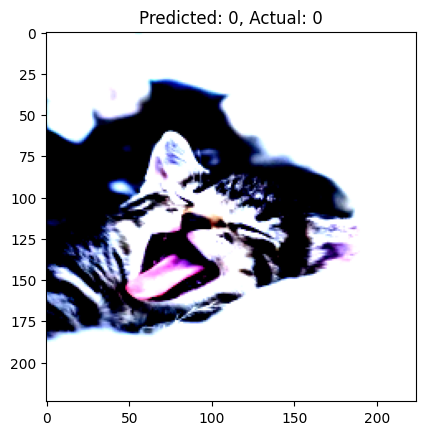

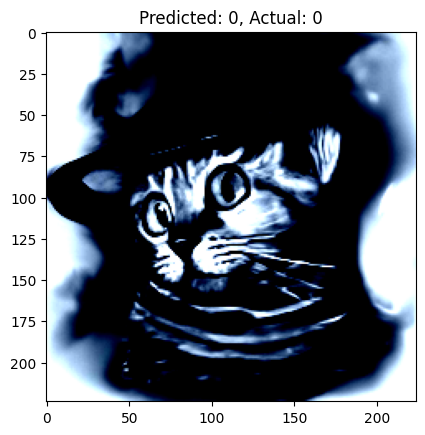

...

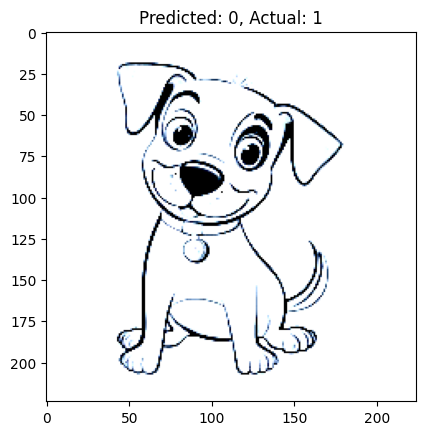

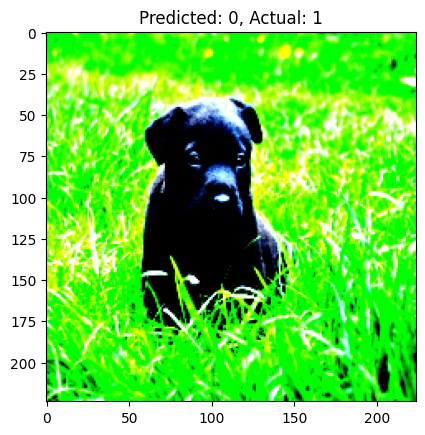

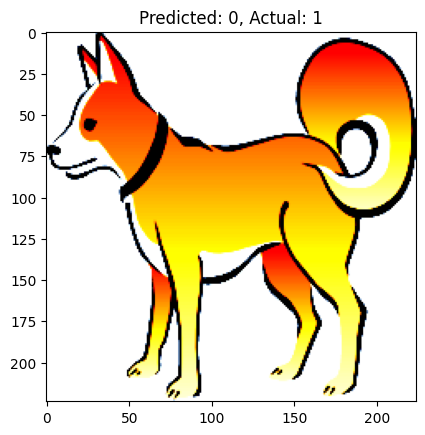

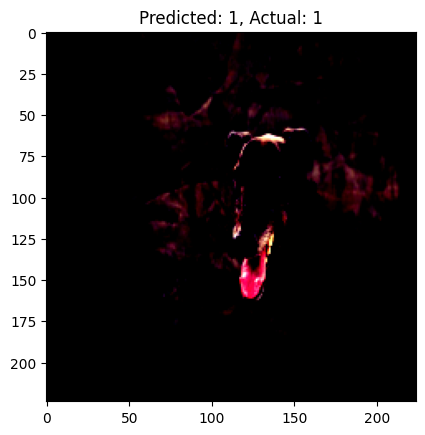

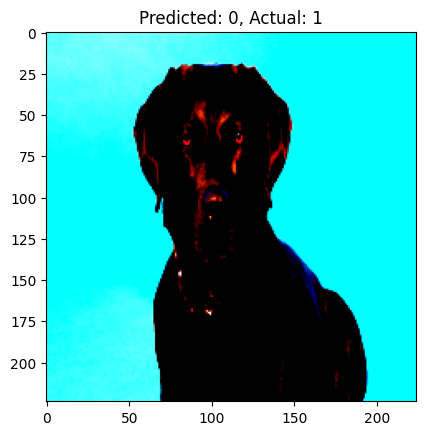

Average Loss:  tensor(0.6936, device='cuda:0')   Accuracy:  19  /  39    48 %
F1 Score is: 0.4230769230769231
Classification_Report Score is:               precision    recall  f1-score   support

           0       0.48      0.84      0.62        19
           1       0.50      0.15      0.23        20

    accuracy                           0.49        39
   macro avg       0.49      0.50      0.42        39
weighted avg       0.49      0.49      0.42        39



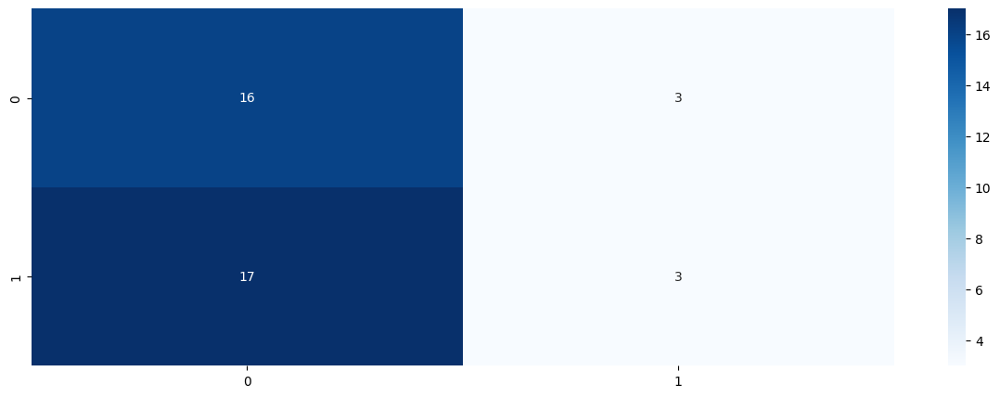

In [ ]:
test(test_dataloader,model)

#Sigle Image INferece

In [ ]:
def ImagePrediction(filepath, model):
    img_array = Image.open(filepath).convert("RGB")
    img_array.show()

    data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Lambda(convert_channels),  # Custom transform to handle 4 or 1 channel images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5341, 0.5063, 0.4630], std=[0.2098, 0.2081, 0.2181])
    ])

    img = data_transforms(img_array).unsqueeze(dim=0) # Returns a new tensor with a dimension of size one inserted at the specified position.
    load = DataLoader(img)

    for x in load:
        x=x.to(device)
        pred = model(x)
        _, preds = torch.max(pred, 1)
        print(f"class : {preds}")
        if preds[0] == 1: print(f"predicted ----> Dog")
        else: print(f"predicted ----> Cat")

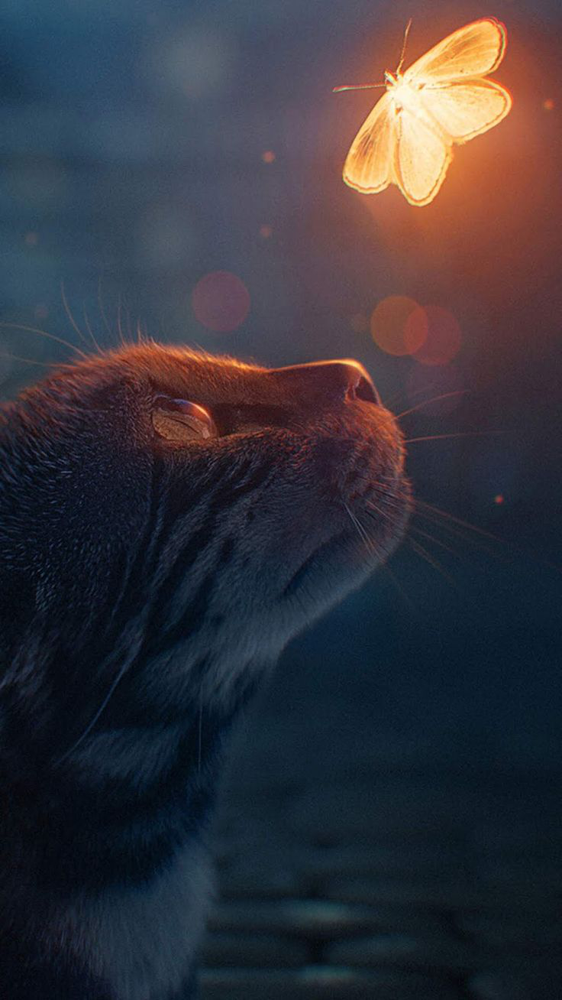

class : tensor([0], device='cuda:0')
predicted ----> Cat


In [ ]:
img_path = '/content/data/val/cat/08a2f0101c5e7a3d11b03c7b5e78c353.jpg'

ImagePrediction(img_path,model)